In [1]:
%load_ext autoreload
%autoreload 2

In [248]:
### Initial imports
import logging
import numpy as np
import pandas as pd
import pymc3 as pm
import theano.tensor as T
import matplotlib.pyplot as plt
import os

logging.basicConfig(level=logging.INFO)
log = logging.getLogger(__name__)

import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

from epimodel.pymc3_models import cm_effect
from epimodel.pymc3_models.cm_effect.datapreprocessor import DataPreprocessorV2

%matplotlib inline

os.environ["THEANO_FLAGS"] = "mode=FAST_RUN,device=gpu,floatX=float32"

In [202]:
import matplotlib 
matplotlib.rcParams['text.latex.unicode'] = True

/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/ipykernel_launcher.py:2: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  


In [287]:
# name, epidemicforecasting.org code, OxCGRT code
region_info = [
    ("Andorra", "AD", "AND"),
    ("Austria", "AT",  "AUT"),
    ('Albania','AL','ALB'),
    ("Bosnia and Herzegovina", "BA", "BIH"),
    ("Belgium", "BE", "BEL"),
    ("Bulgaria",  "BG", "BGR"),
    ("Switzerland", "CH", "CHE"),
    ("Czech Republic", "CZ", "CZE"),
    ("Germany", "DE", "DEU"),
    ("Denmark", "DK", "DNK"),
    ("Estonia","EE", "EST"),
    ("Spain", "ES", "ESP"),
    ("Finland", "FI", "FIN"),
    ("France", "FR", "FRA"),
    ("United Kingdom", "GB", "GBR"),
#     ('Georgia','GE','GEO'),
    ("Greece", "GR", "GRC"),
    ("Croatia", "HR", "HRV"),
    ("Hungary", "HU", "HUN"),
    ("Ireland", "IE", "IRL"),
    ("Israel", "IL", "ISR"),
    ("Iceland", "IS", "ISL"),
    ("Italy", "IT", "ITA"),
#     ('Latvia','LV','LVA'),
    ("South Korea", "KR", "KOR"),
#     ('Malta','MT','MLT'),
    ("Morocco", "MA", "MAR"),
    ("Mexico","MX", "MEX"),
    ("Malaysia", "MY", "MYS"),
    ("Netherlands", "NL", "NLD"),
    ('Norway','NO','NOR'),
    ('New Zealand','NZ','NZL'),
    ("Poland","PL", "POL"),
    ('Portugal','PT','PRT'),
    ("Romania","RO", "ROU"),
    ("Serbia", "RS", "SRB"),
    ("Sweden", "SE", "SWE"),
    ("Singapore", "SG", "SGP"),
    ("Slovenia", "SI", "SVN"),
    ("Slovakia", "SK", "SVK"),
    ("South Africa", "ZA",  "ZAF"),
]

region_names = list([x for x, _, _ in region_info])
regions_epi = list([x for _, x, _ in region_info])
regions_oxcgrt = list([x for _, _, x in region_info])

# OxCGRT
oxcgrt_cm_cols = ["C1_School closing", "C1_Flag", "C4_Restrictions on gatherings", "C4_Flag", "C6_Stay at home requirements",
              "C6_Flag", "H2_Testing policy", "H3_Contact tracing"]

oxcgrt_filter = [
    ("Symptomatic Testing", [(6, [2, 3])]),
    ("Public Testing", [(6, [3])]),
    ("Limited Contact Tracing", [(7, [2, 3])]),
    ("Extensive Contact Tracing", [(7, [2, 3])]),
    ("Gatherings lim. 1000", [(2, [2, 3, 4]), (3, [1])]),
    ("Gatherings lim. 100", [(2, [3, 4]), (3, [1])] ),
    ("Gatherings lim. 10", [(2, [4]), (3, [1])] ),
    ("Some Schools Closed", [(0, [3, 2]), (1, [1])]),
    ("All Schools Closed", [(0, [3]), (1, [1])] ),
#     ("Stay at Home, Rec", [(4, [1, 2, 3]), (5, [1])] ),
    ("Stay at Home, Req", [(4, [2, 3]), (5, [1])] ),
]

epifor_features = [
 'Mask wearing over 70%',
 'Business suspended - some',
 'Business suspended - many',
 'Healthcare specialisation',
 'Healthcare specialisation - limited',
 'Outgroup mobility',
 'General curfew',
 'Gatherings limited to 1000',    
 'Gatherings limited to 100',
 'Gatherings limited to 10',
 'Schools and universities closed'
]

ox_epi = {
    'Stay at Home, Req':'General curfew',
    'Gatherings lim. 1000':'Gatherings limited to 1000',
    'Gatherings lim. 100':'Gatherings limited to 100',
    'Gatherings lim. 10':'Gatherings limited to 10',
    'All Schools Closed':'Schools and universities closed'
}

# ox_epi = dict()

final_features_ordered = [
    "Healthcare specialisation",
    'Healthcare specialisation - limited',
    "Symptomatic Testing",
    "Public Testing",
    "Extensive Contact Tracing",
    "Mask wearing over 70%",
    "Business suspended - some",
    "Business suspended - many",
    "Gatherings lim. 1000",    
    "Gatherings lim. 100",
    "Gatherings lim. 10",
    "All Schools Closed",
    "Stay at Home, Req"
]

cm_plot_style = [
            ("\uf7f2", "tab:red"),
            ("\uf7f2", "tab:pink"),
            ("\uf492", "lightskyblue"),
            ("\uf492", "mediumblue"),
            ("\uf002", "black"),
            ("\uf963", "black"),
            ("\uf07a", "tab:orange"),
            ("\uf07a", "tab:red"),
            ("\uf0c0", "lightgrey"),
            ("\uf0c0", "grey"),
            ("\uf0c0", "black"),
            ("\uf19d", "black"),
            ("\uf965", "black")
        ]


nCMs = len(final_features_ordered)

dp = DataPreprocessorV2(min_num_confirmed_mask=100, min_num_active_mask=100, end_date="2020-04-20")

In [288]:
len(final_features_ordered)

13

INFO:epimodel.regions:Name index has 7 potential conflicts: ['american samoa', 'georgia', 'guam', 'northern mariana islands', 'puerto rico', 'united states minor outlying islands', 'virgin islands (u.s.)']
INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:
Countermeasures: Epidemic Forecasting              min   ... mean  ... max   ... unique
 1 Mask wearing over 70%                      0.000 ... 0.072 ... 1.000 ... [0. 1.]
 2 Business suspended - some                  0.000 ... 0.287 ... 1.000 ... [0. 1.]
 3 Business suspended - many                  0.000 ... 0.205 ... 1.000 ... [0. 1.]
 4 Healthcare specialisation                  0.000 ... 0.080 ... 1.000 ... [0. 1.]
 5 Healthcare specialisation - limited        0.000 ... 0.102 ... 1.000 ... [0 1]
 6 Outgroup mobility                          0.000 ... 0.325 ... 1.000 ... [0. 1.]
 7 General curfew                             0.000 ... 0.146 ... 1.000 ... [0. 1.]
 8 Gatherings limited to 1000                 0.000 ... 0.313 ...

(38, 13, 71)


INFO:epimodel.pymc3_models.cm_effect.datapreprocessor:Data Preprocessing Complete using:

{
    "start_date": "2020-2-10",
    "end_date": "2020-04-20",
    "min_final_num_active_cases": 100,
    "min_num_active_mask": 100,
    "min_num_confirmed_mask": 100
}
Selected 38 Regions: f['AD', 'AL', 'AT', 'BA', 'BE', 'BG', 'CH', 'CZ', 'DE', 'DK', 'EE', 'ES', 'FI', 'FR', 'GB', 'GR', 'HR', 'HU', 'IE', 'IL', 'IS', 'IT', 'KR', 'MA', 'MX', 'MY', 'NL', 'NO', 'NZ', 'PL', 'PT', 'RO', 'RS', 'SE', 'SG', 'SI', 'SK', 'ZA']


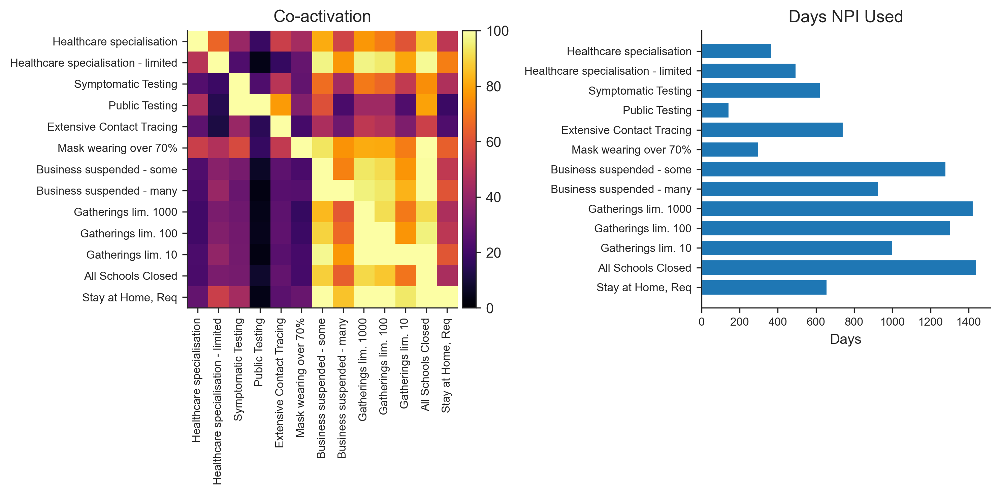

In [289]:
data = dp.preprocess_data("../../data", region_info, oxcgrt_filter, oxcgrt_cm_cols, epifor_features, final_features_ordered, ox_epi)

In [254]:
def mask_region_start(d, region, start):
    i = d.Rs.index(region)
    d.Active.mask[i,start:] = True
    d.Confirmed.mask[i,start:] = True
    d.Deaths.mask[i,start:] = True
    d.NewDeaths.mask[i,start:] = True

def mask_region(d, region, ndays=28):
    i = d.Rs.index(region)
    confirm_start = list(d.Confirmed.mask[i,:]).index(False)
    holdout_cutoff = confirm_start + ndays
    mask_region_start(d, region, holdout_cutoff)
    
mask_region(data, 'DE')
mask_region(data, 'ES')
mask_region(data, 'GB')
mask_region(data, 'GR')

In [290]:
with cm_effect.models.CMDeath(data) as model:
    model.build_model()

/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/pymc3/model.py:1430: ImputationWarning: Data in LogObservedDeaths contains missing values and will be automatically imputed from the sampling distribution.
  warnings.warn(impute_message, ImputationWarning)


In [256]:
model.profile(model.logpt).summary()

Function profiling
  Message: /Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/pymc3/model.py:1023
  Time in 1000 calls to Function.__call__: 1.043778e+00s
  Time in Function.fn.__call__: 9.987912e-01s (95.690%)
  Time in thunks: 9.298351e-01s (89.084%)
  Total compile time: 1.330704e+00s
    Number of Apply nodes: 270
    Theano Optimizer time: 1.883507e-05s
       Theano validate time: 0.000000e+00s
    Theano Linker time (includes C, CUDA code generation/compiling): 1.345141e-01s
       Import time 0.000000e+00s
       Node make_thunk time 1.269131e-01s
           Node InplaceDimShuffle{x}(Elemwise{neg,no_inplace}.0) time 1.037121e-03s
           Node InplaceDimShuffle{x,x}(TensorConstant{-inf}) time 1.006842e-03s
           Node InplaceDimShuffle{1,0}(AdvancedSubtensor1.0) time 9.279251e-04s
           Node InplaceDimShuffle{x}(TensorConstant{-inf}) time 9.200573e-04s
           Node InplaceDimShuffle{x}(TensorConstant{2}) time 

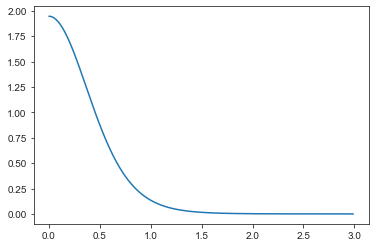

In [33]:
dist = pm.HalfStudentT.dist(nu=10, sigma=.4)

x = np.arange(0, 3, 0.01)
plt.plot(x, np.exp(dist.logp(x).eval()))

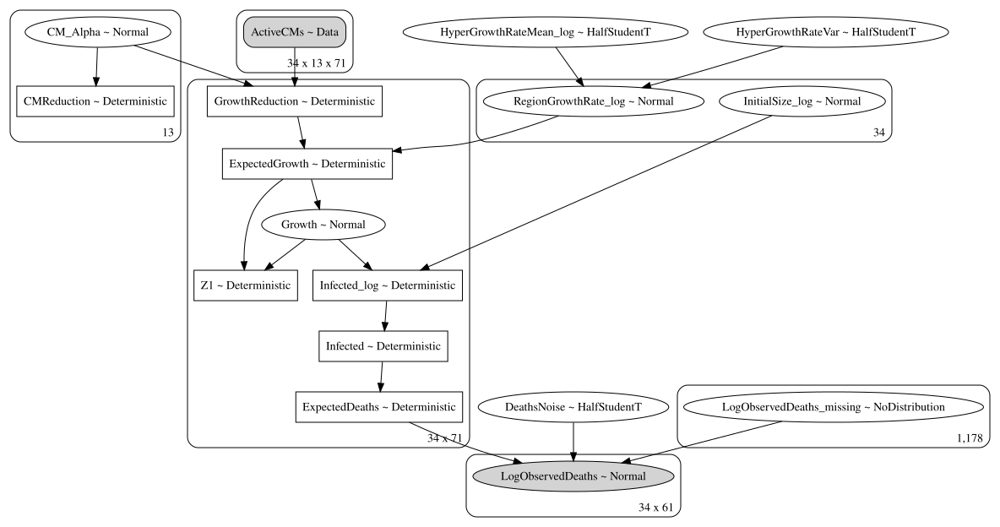

In [34]:
pm.model_to_graphviz(model).render("model-death")
pm.model_to_graphviz(model)

In [291]:
with model:
    model.trace = pm.sample(2000, chains=2, cores=8, init="adapt_diag", target_accept=0.95)

Auto-assigning NUTS sampler...
INFO:pymc3:Auto-assigning NUTS sampler...
Initializing NUTS using adapt_diag...
INFO:pymc3:Initializing NUTS using adapt_diag...
Multiprocess sampling (2 chains in 8 jobs)
INFO:pymc3:Multiprocess sampling (2 chains in 8 jobs)
NUTS: [LogObservedDeaths_missing, DeathsNoise, InitialSize_log, Growth, RegionGrowthRate_log, HyperGrowthRateVar, HyperGrowthRateMean_log, CM_Alpha]
INFO:pymc3:NUTS: [LogObservedDeaths_missing, DeathsNoise, InitialSize_log, Growth, RegionGrowthRate_log, HyperGrowthRateVar, HyperGrowthRateMean_log, CM_Alpha]
Sampling 2 chains, 0 divergences: 100%|██████████| 5000/5000 [34:55<00:00,  2.39draws/s]
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
INFO:pymc3:The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.
ERROR:pymc3:The estimated number of

In [36]:
model.trace.varnames

['CM_Alpha',
 'HyperGrowthRateMean_log_log__',
 'HyperGrowthRateVar_log__',
 'RegionGrowthRate_log',
 'Growth',
 'InitialSize_log',
 'DeathsNoise_log__',
 'LogObservedDeaths_missing',
 'CMReduction',
 'HyperGrowthRateMean_log',
 'HyperGrowthRateVar',
 'GrowthReduction',
 'ExpectedGrowth',
 'Z1',
 'Infected_log',
 'Infected',
 'DeathsNoise',
 'ExpectedDeaths']

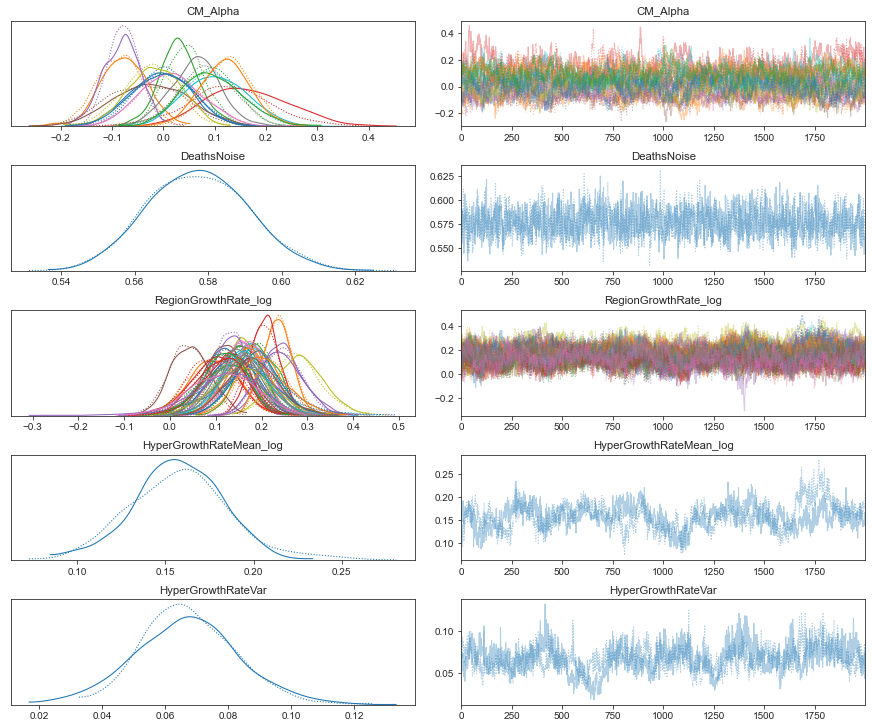

In [292]:
pm.traceplot(model.trace, ["CM_Alpha", "DeathsNoise", "RegionGrowthRate_log", "HyperGrowthRateMean_log", "HyperGrowthRateVar"]);

In [335]:
for f, m, l, u in zip(final_features_ordered, 
     np.mean(model.trace["CMReduction"], axis=0).tolist(), 
     np.percentile(model.trace["CMReduction"], 2.5,  axis=0).tolist(), 
     np.percentile(model.trace["CMReduction"], 97.5, axis=0).tolist()):
    print(f"{f}: {m:.4f} [{l:.4f}, {u:.4f}]")

Healthcare specialisation: 1.0028 [0.8973, 1.1139]
Healthcare specialisation - limited: 1.0876 [0.9974, 1.1887]
Symptomatic Testing: 0.9645 [0.8870, 1.0404]
Public Testing: 0.8687 [0.7288, 1.0221]
Extensive Contact Tracing: 1.0836 [1.0149, 1.1588]
Mask wearing over 70%: 1.0337 [0.8970, 1.1853]
Business suspended - some: 0.9875 [0.8745, 1.1051]
Business suspended - many: 0.9313 [0.8369, 1.0296]
Gatherings lim. 1000: 1.0244 [0.9271, 1.1351]
Gatherings lim. 100: 0.9076 [0.8007, 1.0139]
Gatherings lim. 10: 1.0034 [0.8946, 1.1256]
All Schools Closed: 0.8859 [0.8060, 0.9732]
Stay at Home, Req: 0.9161 [0.8147, 1.0222]


INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out


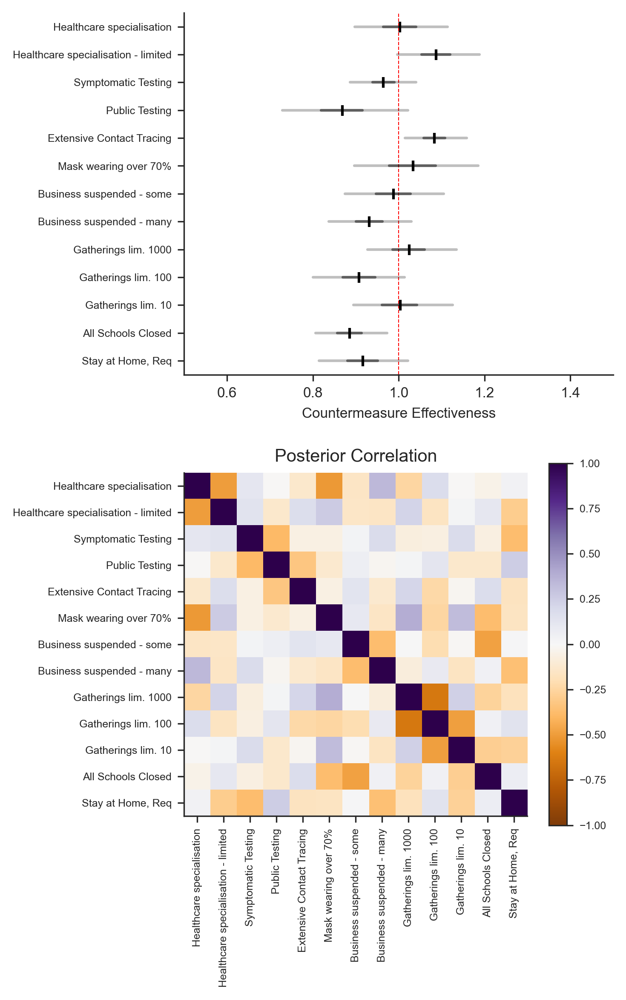

In [293]:
model.plot_effect()

In [278]:
model.d.NewDeaths.data

array([[nan, nan, nan, ..., nan,  1.,  1.],
       [nan, nan, nan, ..., 12.,  9., 18.],
       [nan, nan, nan, ...,  1.,  1.,  1.],
       ...,
       [nan, nan, nan, ...,  4.,  4.,  3.],
       [nan, nan, nan, ..., 11.,  1.,  1.],
       [nan, nan, nan, ...,  2.,  2.,  4.]])

INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out
INFO:epimodel.pymc3_models.cm_effect.models:Saving Plot at /Users/mrinank/workspace/epidemicforecasting/epimodel/notebooks/OxCGRT/out


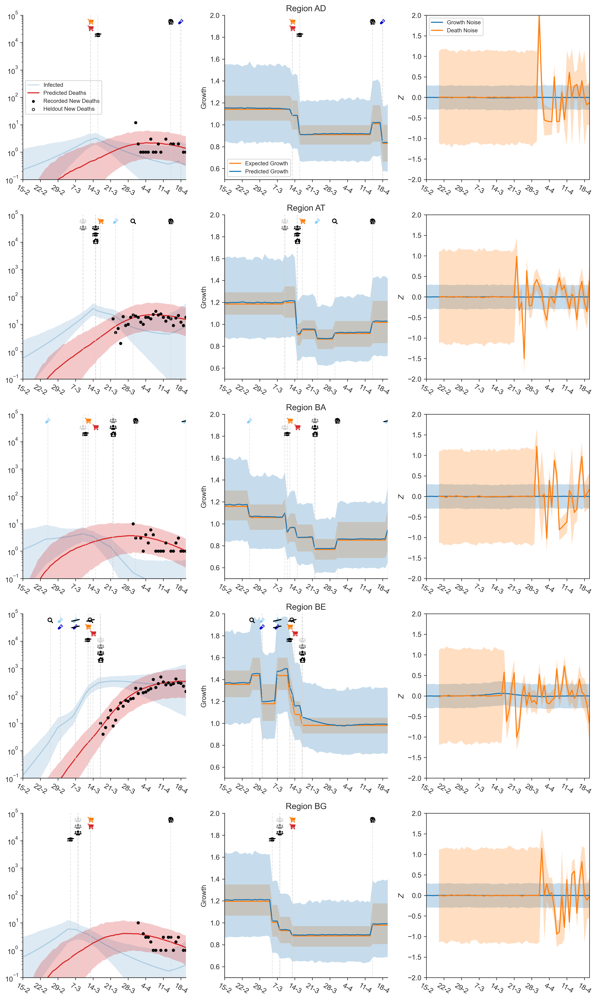

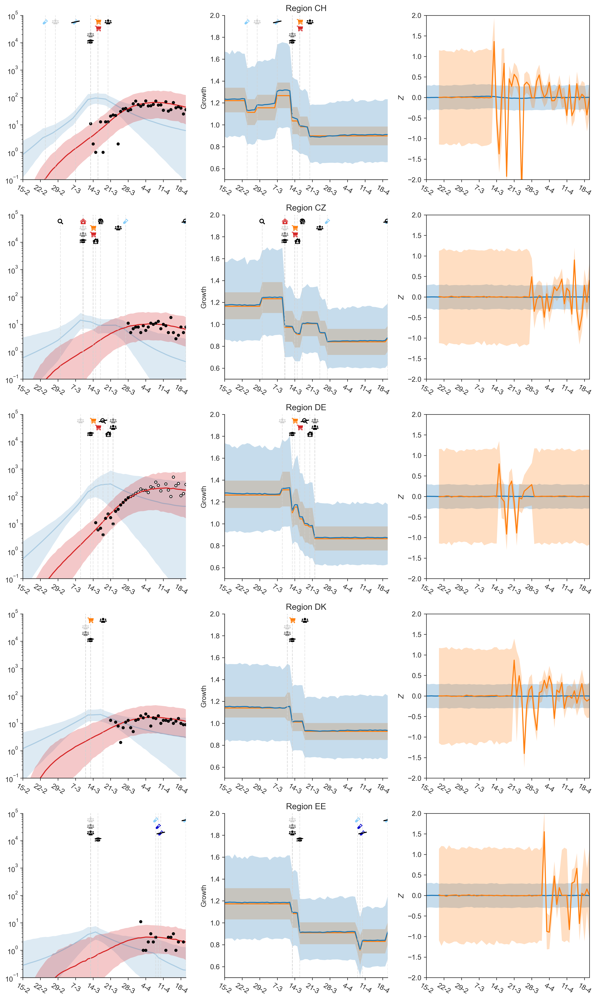

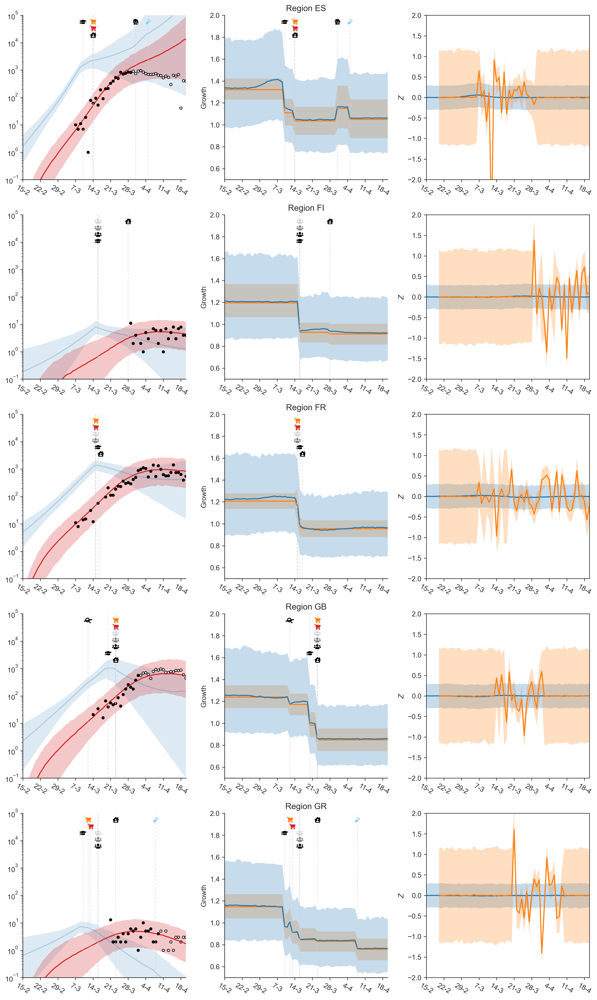

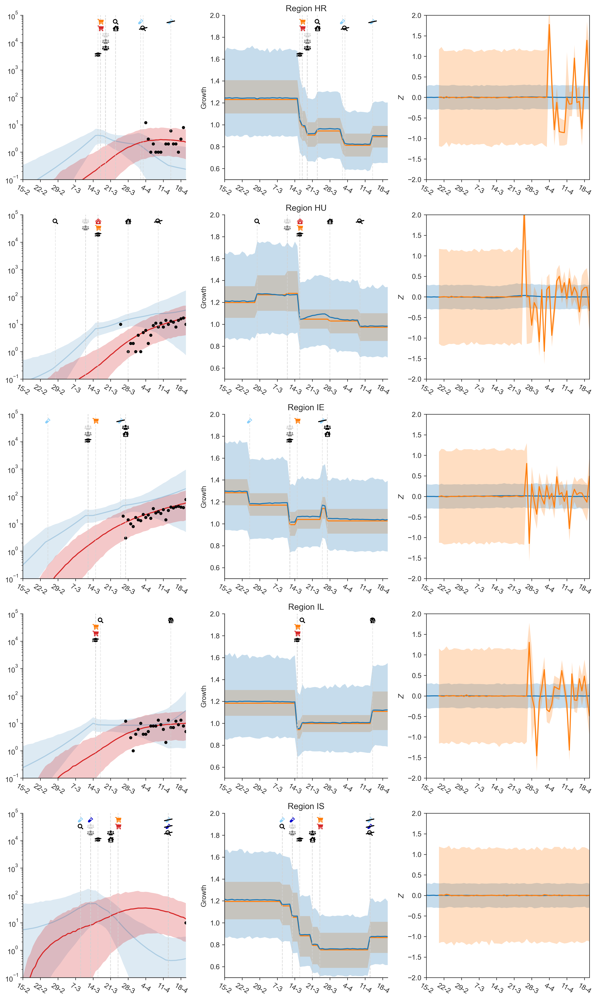

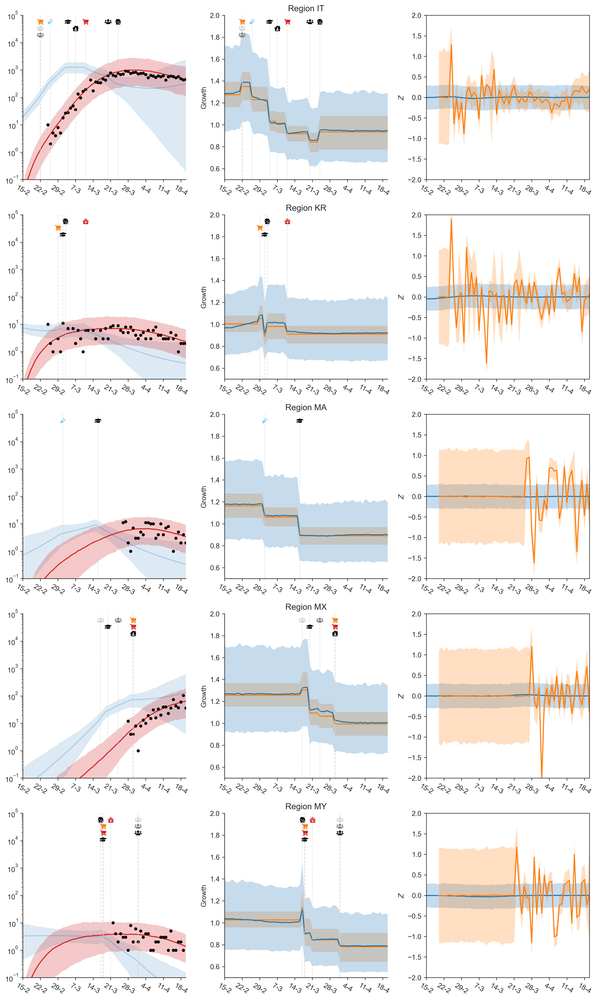

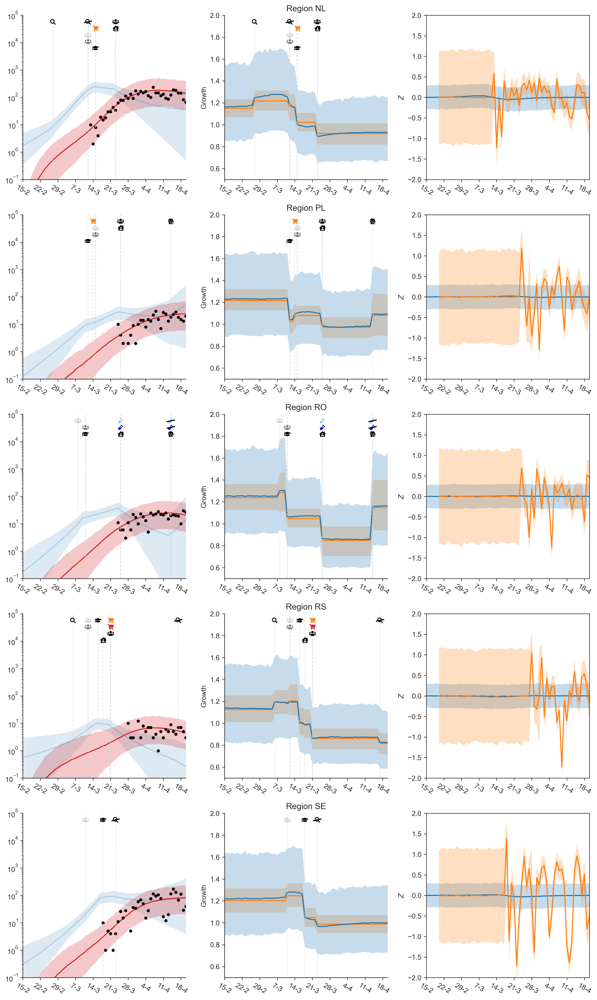

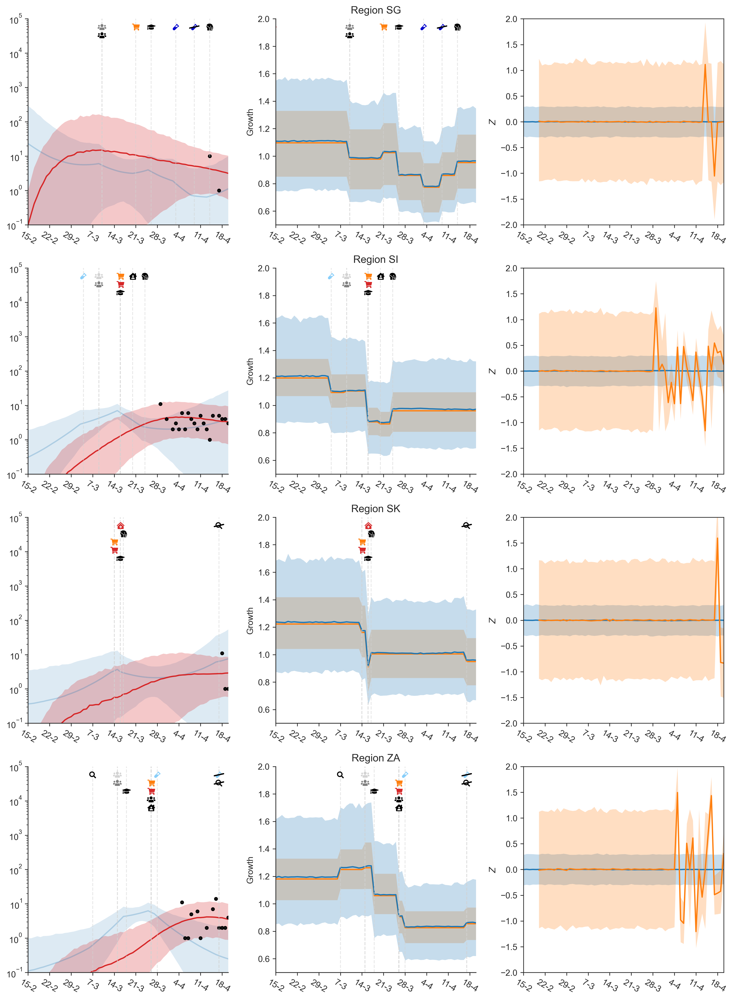

In [286]:
model.plot_region_predictions(cm_plot_style)

# Visualise Differences in Active vs Death Based Models

In [39]:
pm.stats.rhat(model.trace)

[autoreload of epimodel.pymc3_models.cm_effect.models failed: Traceback (most recent call last):
  File "/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/Users/mrinank/Library/Caches/pypoetry/virtualenvs/epimodel-H-ywULmv-py3.7/lib/python3.7/site-packages/IPython/extensions/autoreload.py", line 394, in superreload
    module = reload(module)
  File "/usr/local/Cellar/python/3.7.4_1/Frameworks/Python.framework/Versions/3.7/lib/python3.7/imp.py", line 314, in reload
    return importlib.reload(module)
  File "/usr/local/Cellar/python/3.7.4_1/Frameworks/Python.framework/Versions/3.7/lib/python3.7/importlib/__init__.py", line 169, in reload
    _bootstrap._exec(spec, module)
  File "<frozen importlib._bootstrap>", line 630, in _exec
  File "<frozen importlib._bootstrap_external>", line 724, in exec_module
  File "<frozen importlib

<xarray.Dataset>
Dimensions:                          (CMReduction_dim_0: 13, CM_Alpha_dim_0: 13, ExpectedDeaths_dim_0: 34, ExpectedDeaths_dim_1: 71, ExpectedGrowth_dim_0: 34, ExpectedGrowth_dim_1: 71, GrowthReduction_dim_0: 34, GrowthReduction_dim_1: 71, Growth_dim_0: 34, Growth_dim_1: 71, Infected_dim_0: 34, Infected_dim_1: 71, Infected_log_dim_0: 34, Infected_log_dim_1: 71, InitialSize_log_dim_0: 34, LogObservedDeaths_missing_dim_0: 1178, RegionGrowthRate_log_dim_0: 34, Z1_dim_0: 34, Z1_dim_1: 71)
Coordinates:
  * CM_Alpha_dim_0                   (CM_Alpha_dim_0) int64 0 1 2 3 ... 10 11 12
  * RegionGrowthRate_log_dim_0       (RegionGrowthRate_log_dim_0) int64 0 ... 33
  * Growth_dim_0                     (Growth_dim_0) int64 0 1 2 3 ... 31 32 33
  * Growth_dim_1                     (Growth_dim_1) int64 0 1 2 3 ... 68 69 70
  * InitialSize_log_dim_0            (InitialSize_log_dim_0) int64 0 1 ... 32 33
  * LogObservedDeaths_missing_dim_0  (LogObservedDeaths_missing_dim_0) int64 0 ... 1177
  * CMReduction_dim_0                (CMReduction_dim_0) int64 0 1 2 ... 11 12
  * GrowthReduction_dim_0            (GrowthReduction_dim_0) int64 0 1 ... 32 33
  * GrowthReduction_dim_1            (GrowthReduction_dim_1) int64 0 1 ... 69 70
  * ExpectedGrowth_dim_0             (ExpectedGrowth_dim_0) int64 0 1 ... 32 33
  * ExpectedGrowth_dim_1             (ExpectedGrowth_dim_1) int64 0 1 ... 69 70
  * Z1_dim_0                         (Z1_dim_0) int64 0 1 2 3 4 ... 30 31 32 33
  * Z1_dim_1                         (Z1_dim_1) int64 0 1 2 3 4 ... 67 68 69 70
  * Infected_log_dim_0               (Infected_log_dim_0) int64 0 1 2 ... 32 33
  * Infected_log_dim_1               (Infected_log_dim_1) int64 0 1 2 ... 69 70
  * Infected_dim_0                   (Infected_dim_0) int64 0 1 2 3 ... 31 32 33
  * Infected_dim_1                   (Infected_dim_1) int64 0 1 2 3 ... 68 69 70
  * ExpectedDeaths_dim_0             (ExpectedDeaths_dim_0) int64 0 1 ... 32 33
  * ExpectedDeaths_dim_1             (ExpectedDeaths_dim_1) int64 0 1 ... 69 70
Data variables:
    CM_Alpha                         (CM_Alpha_dim_0) float64 1.113 ... 1.027
    RegionGrowthRate_log             (RegionGrowthRate_log_dim_0) float64 1.039 ... 1.057
    Growth                           (Growth_dim_0, Growth_dim_1) float64 1.003 ... 1.011
    InitialSize_log                  (InitialSize_log_dim_0) float64 1.033 ... 1.06
    LogObservedDeaths_missing        (LogObservedDeaths_missing_dim_0) float64 1.026 ... 1.001
    CMReduction                      (CMReduction_dim_0) float64 1.113 ... 1.027
    HyperGrowthRateMean_log          float64 1.074
    HyperGrowthRateVar               float64 1.017
    GrowthReduction                  (GrowthReduction_dim_0, GrowthReduction_dim_1) float64 nan ... 1.021
    ExpectedGrowth                   (ExpectedGrowth_dim_0, ExpectedGrowth_dim_1) float64 1.039 ... 1.053
    Z1                               (Z1_dim_0, Z1_dim_1) float64 1.0 ... 1.001
    Infected_log                     (Infected_log_dim_0, Infected_log_dim_1) float64 1.033 ... 1.024
    Infected                         (Infected_dim_0, Infected_dim_1) float64 1.033 ... 1.024
    DeathsNoise                      float64 1.002
    ExpectedDeaths                   (ExpectedDeaths_dim_0, ExpectedDeaths_dim_1) float64 nan ... 1.003

In [137]:
CMReductionTrace = np.zeros((4000, 12))
CMReductionTrace[:, 0:3] = model.trace["CMReduction"][:, 0:3]
CMReductionTrace[:, 3:] = model.trace["CMReduction"][:, 4:]

alt_features = [
    "Healthcare specialisation",
    "Symptomatic Testing",
    "Public Testing",
    "Extensive Contact Tracing",
    "Mask wearing over 70%",
    "Business suspended - some",
    "Business suspended - many",
    'Stay at Home, Req',
    'Gatherings lim. 1000',    
    'Gatherings lim. 100',
    'Gatherings lim. 10',
    'All Schools Closed',
]

In [309]:
def compute_R(growth_rate, alpha=(1/(0.62**2)), beta=(1/(6.5 * 0.62 ** 2))):
    def M(z):
        if z > beta:
            raise ValueError("invalid z")
        else:
            return (1 - (z/beta)) ** -alpha
    
    return 1/M(-(growth_rate - 1))

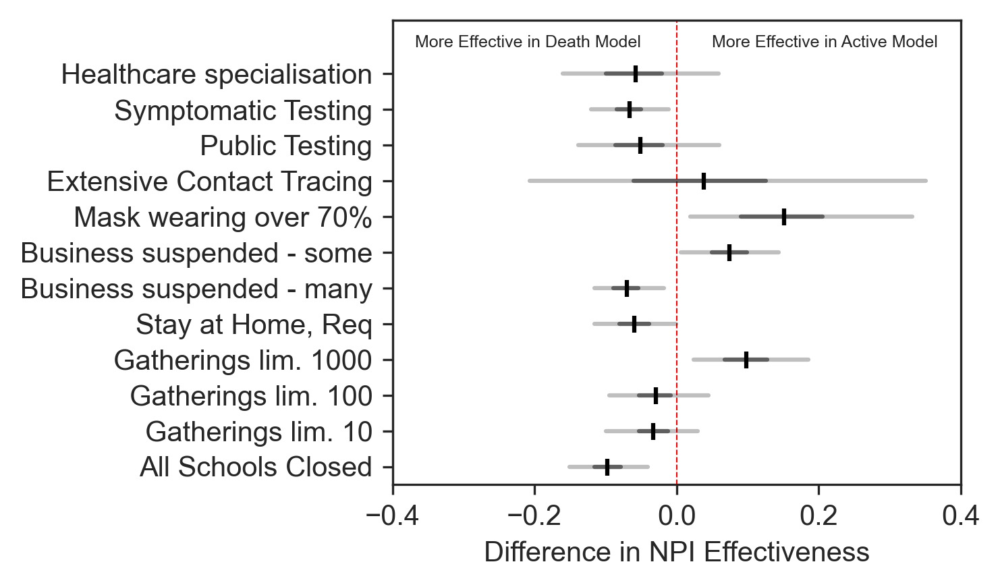

In [142]:
import seaborn as sns 

np.savetxt("death_results.csv", CMReductionTrace, delimiter=",")
active_results = np.loadtxt("active_results.csv", delimiter=",")
death_results = np.loadtxt("death_results.csv", delimiter=",")


# why sort? we want to be permutation invariatn to the samples!
active_results_sorted = np.sort(active_results, axis=0)
death_results_sorted = np.sort(death_results, axis=0)

dif = death_results_sorted - active_results_sorted
S, nCMs = death_results.shape

means = np.mean(dif, axis=0)
med = np.percentile(dif, 50, axis=0)
li = np.percentile(dif, 2.5, axis=0)
ui = np.percentile(dif, 97.5, axis=0)
lq = np.percentile(dif, 25, axis=0)
uq = np.percentile(dif, 75, axis=0)

sns.set_style("ticks")
plt.figure(figsize=(8, 3), dpi=300)
plt.subplot(121)

y_vals = -1 * np.arange(nCMs)
plt.plot([0, 0], [2, -(nCMs)-1], "--r", linewidth=0.5, zorder=-4)
plt.scatter(means, y_vals, marker="|", color="k", zorder=-1)
for cm in range(nCMs):
    plt.plot([li[cm], ui[cm]], [y_vals[cm], y_vals[cm]], "k", alpha=0.25, zorder=-3)
    plt.plot([lq[cm], uq[cm]], [y_vals[cm], y_vals[cm]], "k", alpha=0.5, zorder=-2)
# plt.scatter(med,y_vals, s=12, marker=".", color="tab:orange", zorder=0)

plt.yticks(y_vals, alt_features)
plt.ylim([-nCMs+0.5, 1.5])
plt.xlim([-0.4, 0.4])
plt.xlabel("Difference in NPI Effectiveness")

plt.text(0.05, 0.75, "More Effective in Active Model", fontsize=6, horizontalalignment="left")
plt.text(-0.05, 0.75, "More Effective in Death Model", fontsize=6, horizontalalignment="right")
plt.tight_layout()

In [ ]:
np.savetxt("death_results.csv", model.trace["CMReduction"], delimiter=",")

In [300]:
death_R_results.shape

(4000, 13)

In [302]:
death_results.shape

(4000, 13)

In [304]:
hist_death_R, _ = np.histogram(death_R_results[:, cm], bins=bin_edges)

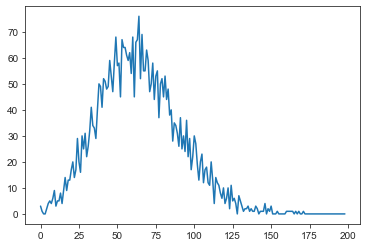

In [306]:
plt.plot(hist_death_R)

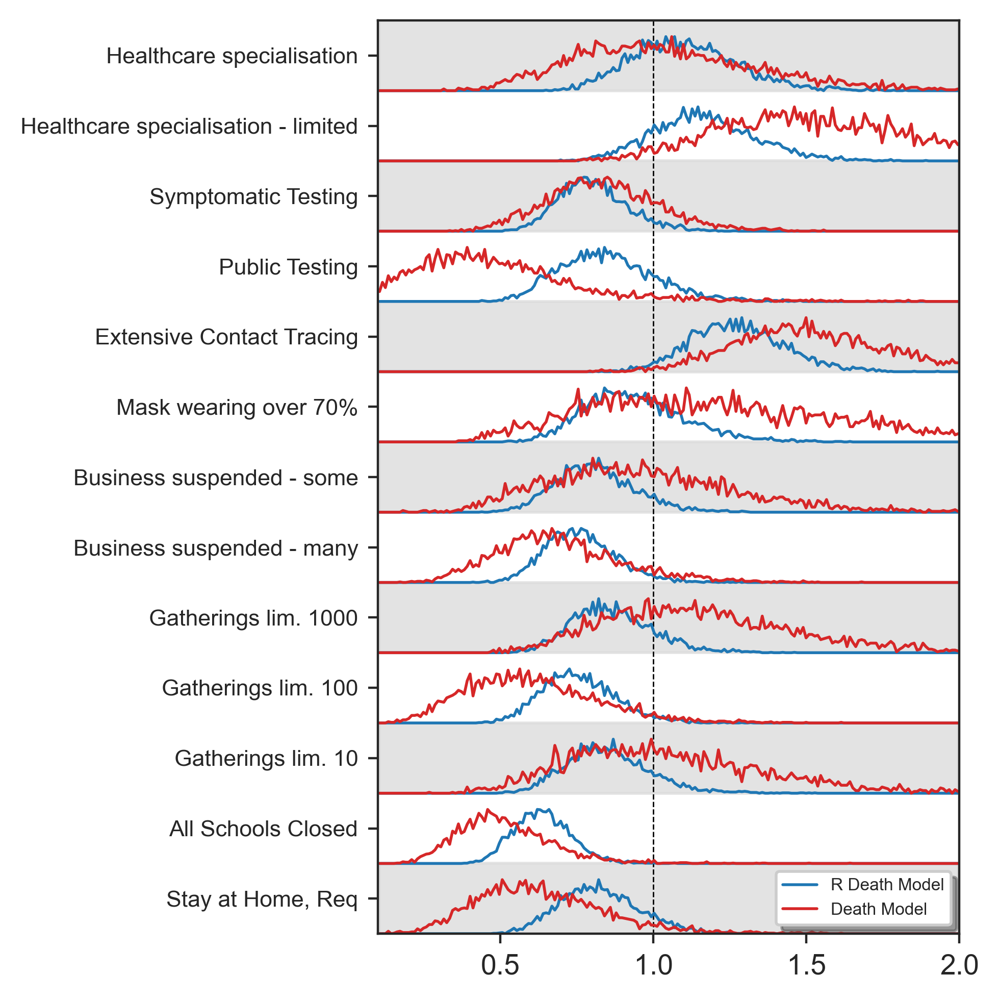

In [318]:
import seaborn as sns 

nCMs = 13 

final_features_ordered = [
    "Healthcare specialisation",
    'Healthcare specialisation - limited',
    "Symptomatic Testing",
    "Public Testing",
    "Extensive Contact Tracing",
    "Mask wearing over 70%",
    "Business suspended - some",
    "Business suspended - many",
    "Gatherings lim. 1000",    
    "Gatherings lim. 100",
    "Gatherings lim. 10",
    "All Schools Closed",
    "Stay at Home, Req"
]

g_0 = np.exp(np.mean(model.trace["HyperGrowthRateMean_log"]))
R_0 = compute_R(g_0)

np.savetxt("death_results.csv", model.trace["CMReduction"], delimiter=",")
death_R_results = np.loadtxt("death_R_results.csv", delimiter=",")

death_results_temp = g_0 * np.loadtxt("death_results.csv", delimiter=",")
nS, nCMs = death_results_temp.shape
death_results = np.zeros((nS, nCMs))

for i in range(nS):
    for j in range(nCMs):
        death_results[i, j] = (compute_R(death_results_temp[i, j])) / R_0

sns.set_style("ticks")
plt.figure(figsize=(8, 5), dpi=400)
plt.subplot(121)

y_vals = -1 * np.arange(nCMs) - 0.5
x_min = 0.1
x_max = 2

bin_edges = np.linspace(x_min, x_max, 200)
bin_centers = (bin_edges[1:] + bin_edges[:-1]) / 2

plt.plot([1, 1], [0.5, -nCMs+0.5], '--', color="black", linewidth=0.5)
for height in range(0, nCMs, 2):
    plt.fill_between(bin_centers, -(height-0.5)* np.ones_like(bin_centers), -(height+0.5)* np.ones_like(bin_centers), color="gainsboro", alpha=0.8)

for cm in range(nCMs):
    hist_death_R, _ = np.histogram(death_R_results[:, cm], bins=bin_edges)
    hist_death_R = hist_death_R / (1.3 * np.max(hist_death_R))
    
    hist_death, _ = np.histogram(death_results[:, cm], bins=bin_edges)
    hist_death = hist_death / (1.3 * np.max(hist_death))
    if cm == 0:
        plt.plot(bin_centers, hist_death_R + y_vals[cm], color="tab:blue", label="R Death Model", linewidth=1)
        plt.plot(bin_centers, hist_death + y_vals[cm], color="tab:red", label="Death Model", linewidth=1)
    else:
        plt.plot(bin_centers, hist_death_R + y_vals[cm], color="tab:blue", linewidth=1)
        plt.plot(bin_centers, hist_death + y_vals[cm], color="tab:red", linewidth=1)

plt.ylim([-nCMs+0.5, 0.5])
plt.yticks(-1 * np.arange(nCMs), final_features_ordered, fontsize=8)
plt.xlim([x_min, x_max])
plt.legend(fontsize=6, shadow=True, fancybox=True)
plt.tight_layout()
plt.savefig("comparison.pdf")

In [152]:
np.histogram(active_results[:, cm], bins=bin_edges)

(array([], dtype=int64), array([0.5]))

In [319]:
R_0

2.517329036523805

In [172]:
bin_edges

array([0.5       , 0.50502513, 0.51005025, 0.51507538, 0.5201005 ,
       0.52512563, 0.53015075, 0.53517588, 0.54020101, 0.54522613,
       0.55025126, 0.55527638, 0.56030151, 0.56532663, 0.57035176,
       0.57537688, 0.58040201, 0.58542714, 0.59045226, 0.59547739,
       0.60050251, 0.60552764, 0.61055276, 0.61557789, 0.62060302,
       0.62562814, 0.63065327, 0.63567839, 0.64070352, 0.64572864,
       0.65075377, 0.65577889, 0.66080402, 0.66582915, 0.67085427,
       0.6758794 , 0.68090452, 0.68592965, 0.69095477, 0.6959799 ,
       0.70100503, 0.70603015, 0.71105528, 0.7160804 , 0.72110553,
       0.72613065, 0.73115578, 0.7361809 , 0.74120603, 0.74623116,
       0.75125628, 0.75628141, 0.76130653, 0.76633166, 0.77135678,
       0.77638191, 0.78140704, 0.78643216, 0.79145729, 0.79648241,
       0.80150754, 0.80653266, 0.81155779, 0.81658291, 0.82160804,
       0.82663317, 0.83165829, 0.83668342, 0.84170854, 0.84673367,
       0.85175879, 0.85678392, 0.86180905, 0.86683417, 0.87185

In [232]:
np.max(bin_edges)

1.5

In [237]:
x = np.arange(10)

In [238]:
c = 5

In [240]:
x[c-3:c+4]

array([2, 3, 4, 5, 6, 7, 8])

In [314]:
compute_R(g_0)

2.517329036523805

In [ ]:
with cm_effect.models.CMDeath(data) as model:
    model.build_model()